# Business Objective

# Import Dependencies

In [1]:
import os
import sys
import warnings
import pandas
import numpy
import re
import matplotlib

import plotly as px
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.preprocessing import StandardScaler
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error,mean_absolute_error

# Fetch Dataset

In [2]:
pwd

'C:\\Users\\avina\\OneDrive\\Desktop\\Projects'

In [3]:
df = pd.read_csv("C:\\Users\\avina\\OneDrive\\Desktop\\Projects\\ds_salaries.csv")
df.head()

,work_year,experience_level,employment_type,job_title,salary,salary_currency,salary_in_usd,employee_residence,remote_ratio,company_location,company_size
0,2023,SE,FT,Principal Data Scientist,80000,EUR,85847,ES,100,ES,L
1,2023,MI,CT,ML Engineer,30000,USD,30000,US,100,US,S
2,2023,MI,CT,ML Engineer,25500,USD,25500,US,100,US,S
3,2023,SE,FT,Data Scientist,175000,USD,175000,CA,100,CA,M
4,2023,SE,FT,Data Scientist,120000,USD,120000,CA,100,CA,M


In [4]:
df.tail()

,work_year,experience_level,employment_type,job_title,salary,salary_currency,salary_in_usd,employee_residence,remote_ratio,company_location,company_size
3750,2020,SE,FT,Data Scientist,412000,USD,412000,US,100,US,L
3751,2021,MI,FT,Principal Data Scientist,151000,USD,151000,US,100,US,L
3752,2020,EN,FT,Data Scientist,105000,USD,105000,US,100,US,S
3753,2020,EN,CT,Business Data Analyst,100000,USD,100000,US,100,US,L
3754,2021,SE,FT,Data Science Manager,7000000,INR,94665,IN,50,IN,L


In [5]:
df.shape

(3755, 11)

In [6]:
df.columns

Index(['work_year', 'experience_level', 'employment_type', 'job_title',
       'salary', 'salary_currency', 'salary_in_usd', 'employee_residence',
       'remote_ratio', 'company_location', 'company_size'],
      dtype='object')

In [7]:
df.isnull().sum()

work_year             0
experience_level      0
employment_type       0
job_title             0
salary                0
salary_currency       0
salary_in_usd         0
employee_residence    0
remote_ratio          0
company_location      0
company_size          0
dtype: int64

In [8]:
df.duplicated().sum()

1171

In [9]:
df.drop_duplicates(keep = 'first',inplace=True)

In [10]:
df.duplicated().sum()

0

In [11]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2584 entries, 0 to 3754
Data columns (total 11 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   work_year           2584 non-null   int64 
 1   experience_level    2584 non-null   object
 2   employment_type     2584 non-null   object
 3   job_title           2584 non-null   object
 4   salary              2584 non-null   int64 
 5   salary_currency     2584 non-null   object
 6   salary_in_usd       2584 non-null   int64 
 7   employee_residence  2584 non-null   object
 8   remote_ratio        2584 non-null   int64 
 9   company_location    2584 non-null   object
 10  company_size        2584 non-null   object
dtypes: int64(4), object(7)
memory usage: 242.2+ KB


## Dataset Features

### Note: 
  1. From above dataset analysis it is clear that we have 11 Features/columns and 3755 Records/rows.
  2. We have 7 featues which are Categorical.
  3. Remaining 4 features are Continuous.

### Target Feature:
 #### We have to find out salary_in_usd

In [12]:
df.describe()

,work_year,salary,salary_in_usd,remote_ratio
count,2584.000000,2.584000e+03,2584.000000,2584.000000
mean,2022.301084,2.103653e+05,133409.280186,50.483746
std,0.749179,8.080375e+05,67136.837329,48.163707
min,2020.000000,6.000000e+03,5132.000000,0.000000
25%,2022.000000,9.000000e+04,84975.000000,0.000000
50%,2022.000000,1.346300e+05,130000.000000,50.000000
75%,2023.000000,1.825625e+05,175000.000000,100.000000
max,2023.000000,3.040000e+07,450000.000000,100.000000


In [13]:
df.corr()

C:\Users\avina\AppData\Local\Temp\ipykernel_1684\1134722465.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  df.corr()


,work_year,salary,salary_in_usd,remote_ratio
work_year,1.000000,-0.099153,0.236958,-0.219160
salary,-0.099153,1.000000,-0.043672,0.026485
salary_in_usd,0.236958,-0.043672,1.000000,-0.084502
remote_ratio,-0.219160,0.026485,-0.084502,1.000000


# EDA(Exploratry Data Analysis)
## Data Visualization

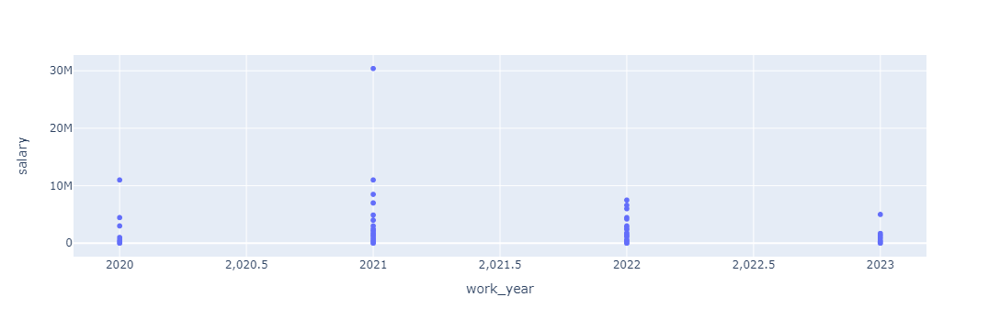

In [14]:
import plotly.express as px
fig = px.scatter(df,x='work_year',y = 'salary')
fig.show()

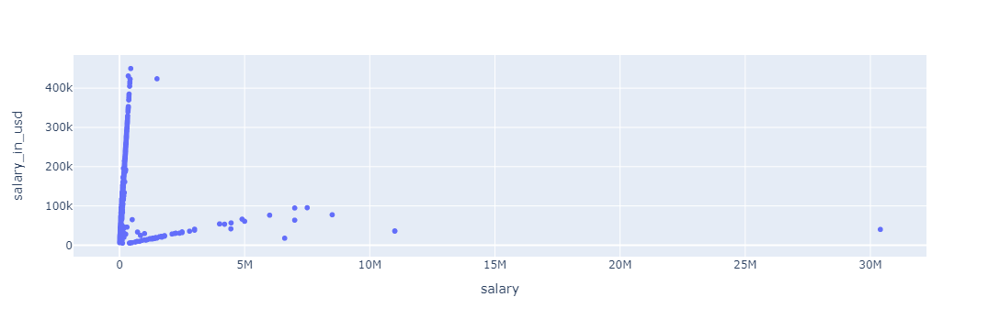

In [15]:
fig = px.scatter(df,x = 'salary', y = 'salary_in_usd')
fig.show()

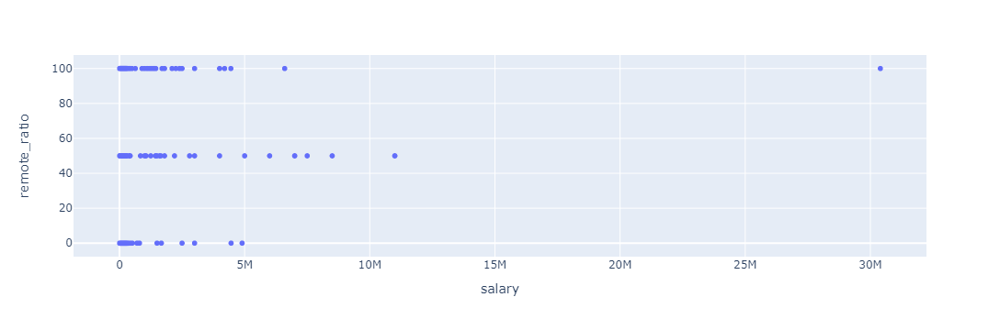

In [16]:
fig = px.scatter(df, x = 'salary', y = 'remote_ratio')
fig.show()

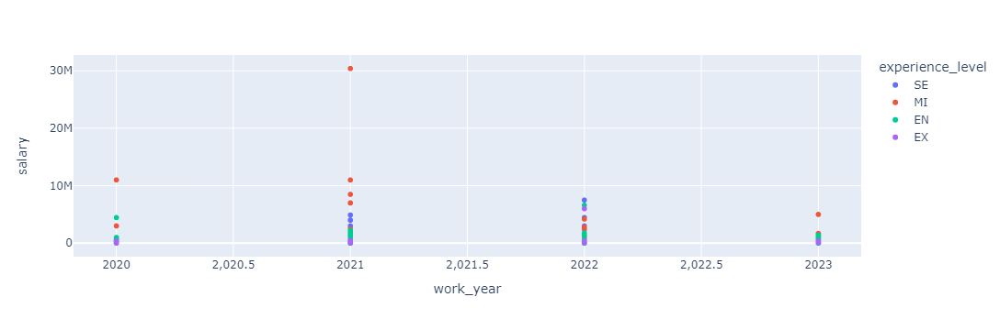

In [17]:
fig = px.scatter(df, x="work_year", y="salary", color="experience_level")
fig.show()

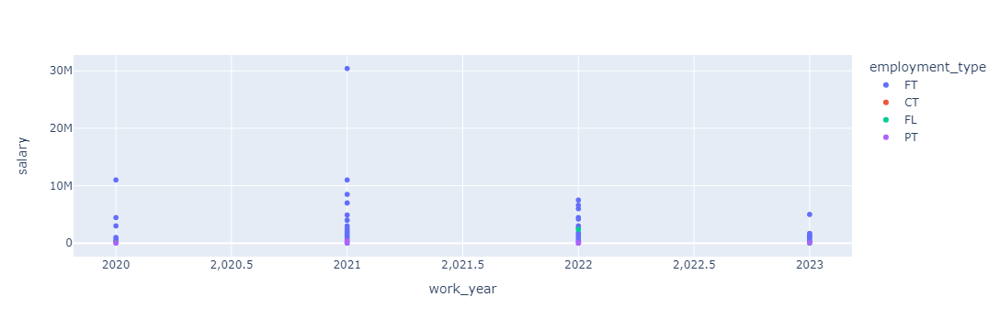

In [18]:
fig = px.scatter(df, x = 'work_year',y = 'salary',color = 'employment_type')
fig.show()

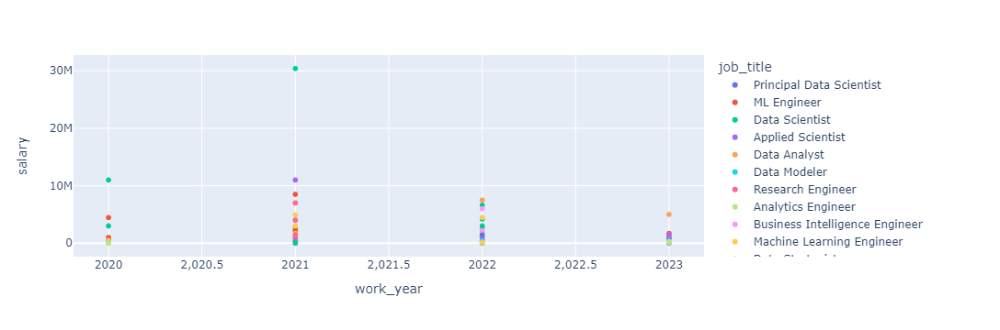

In [19]:
fig = px.scatter(df,x = 'work_year',y = 'salary',color= 'job_title')
fig.show()

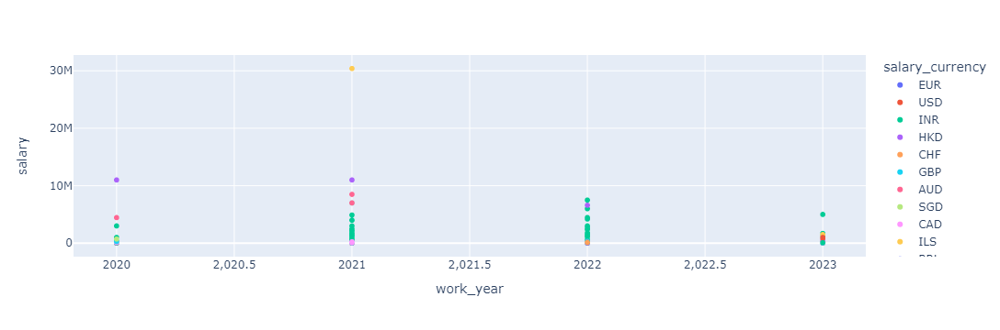

In [27]:
fig = px.scatter(df,x = 'work_year',y = 'salary',color = 'salary_currency')
fig.show()

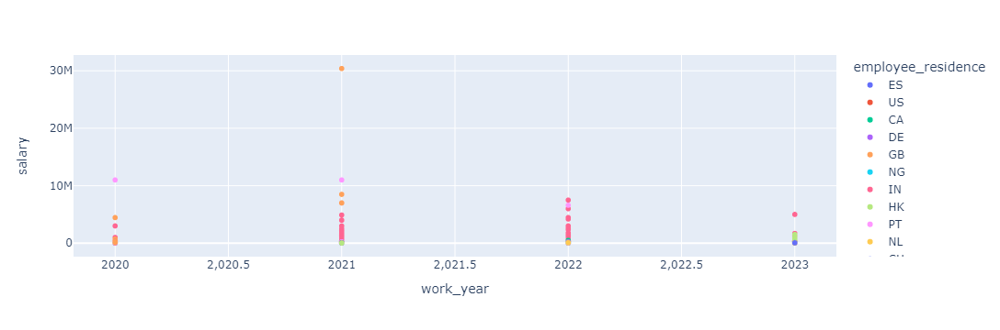

In [26]:
fig = px.scatter(df, x ='work_year', y = 'salary',color = 'employee_residence')
fig.show()

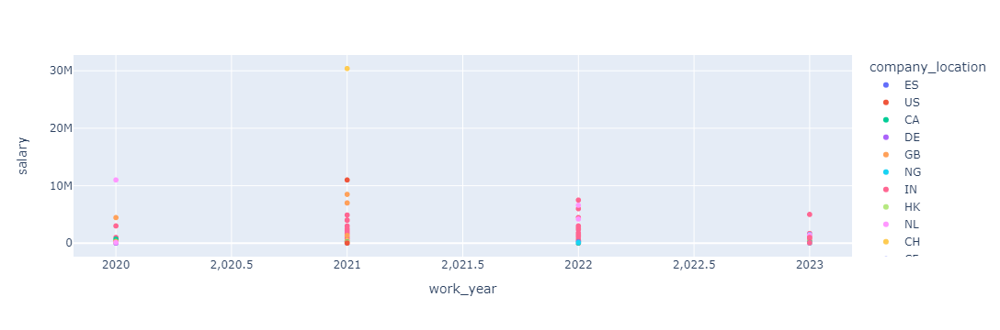

In [22]:
fig = px.scatter(df, x = 'work_year',y = 'salary',color = 'company_location')
fig.show()

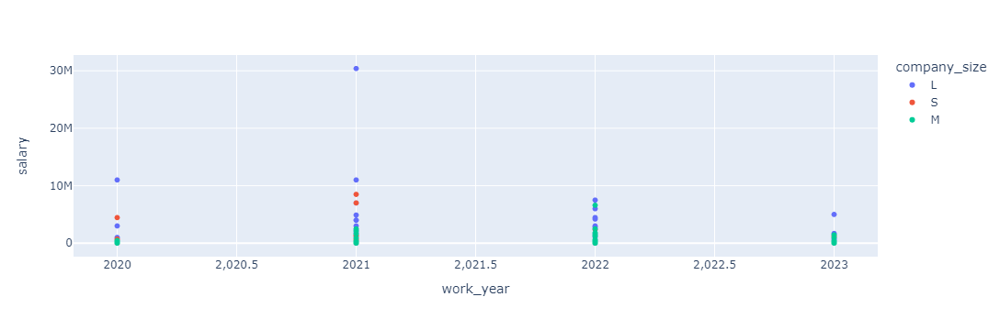

In [23]:
fig = px.scatter(df, x = 'work_year', y = 'salary',color = 'company_size')
fig.show()

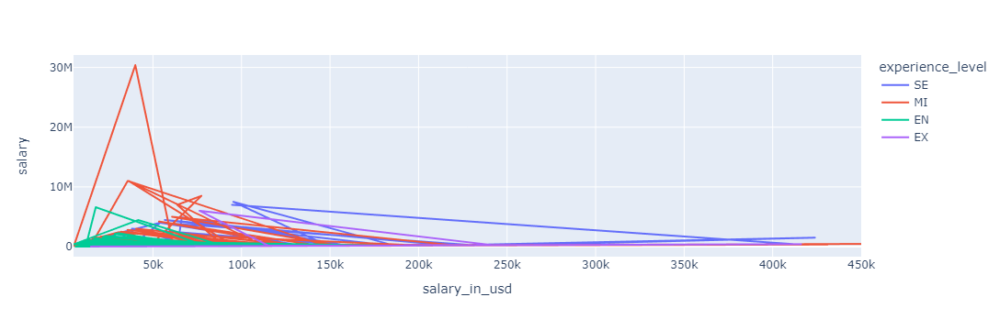

In [56]:
fig = px.line(df,x = 'salary_in_usd', y = 'salary',color = 'experience_level')
fig.show()

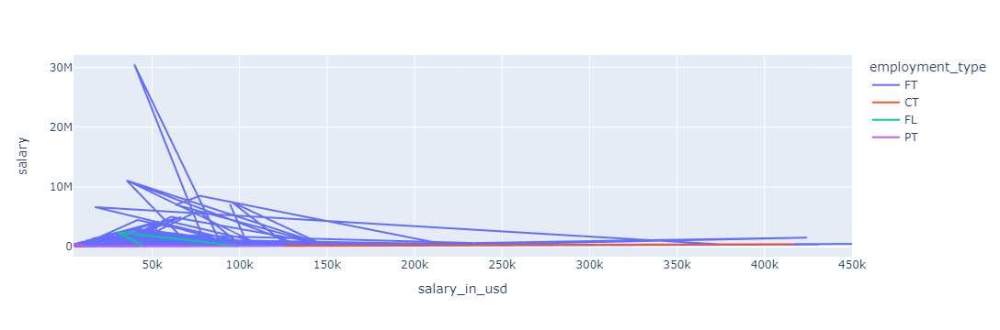

In [29]:
fig = px.line(df,x ='salary_in_usd',y = 'salary',color = 'employment_type')
fig.show()

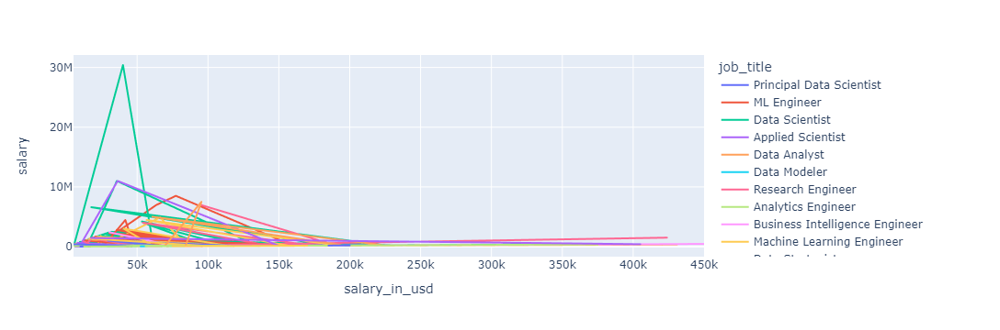

In [33]:
fig = px.line(df,x = 'salary_in_usd',y = 'salary',color = 'job_title')
fig.show()

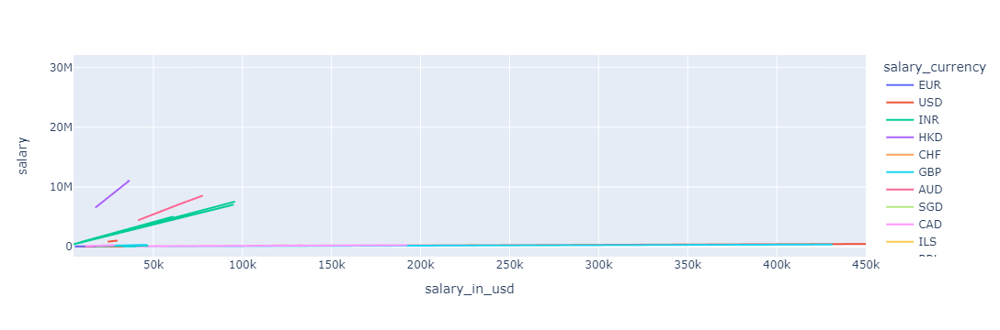

In [34]:
fig = px.line(df,x = 'salary_in_usd', y = 'salary', color = 'salary_currency')
fig.show()

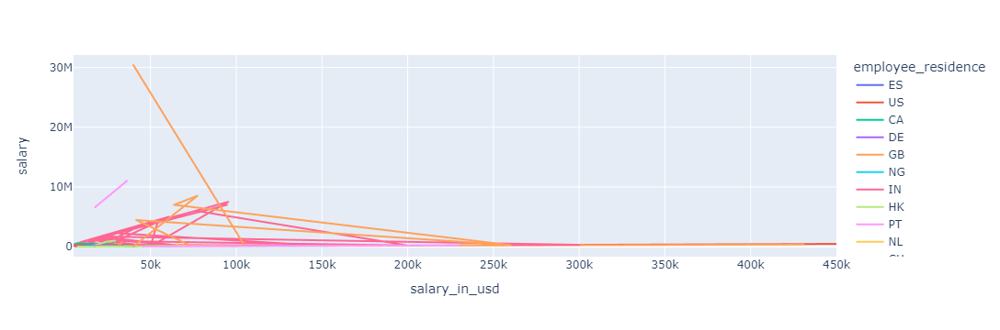

In [35]:
fig = px.line(df, x ='salary_in_usd',y = 'salary',color ='employee_residence')
fig.show()

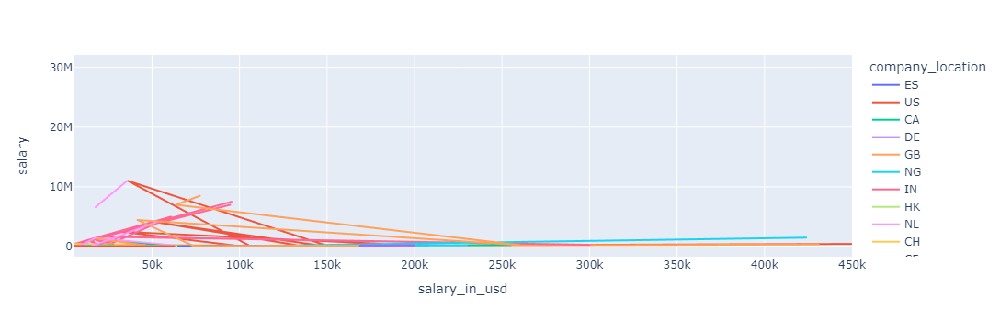

In [36]:
fig = px.line(df, x = 'salary_in_usd', y ='salary',color = 'company_location')
fig.show()

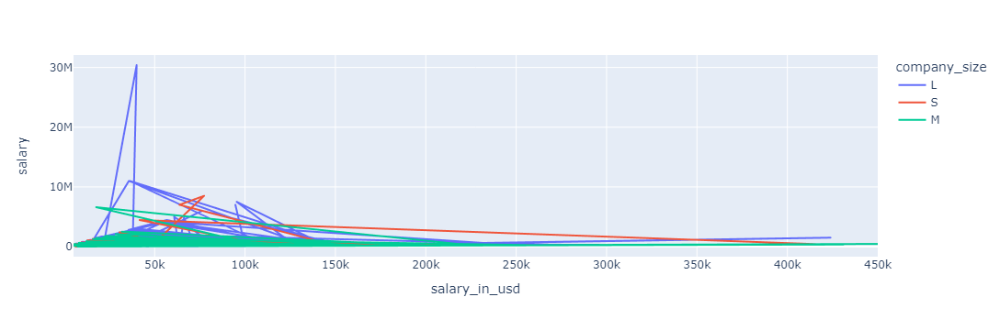

In [37]:
fig = px.line(df, x = 'salary_in_usd', y = 'salary', color = 'company_size')
fig.show()

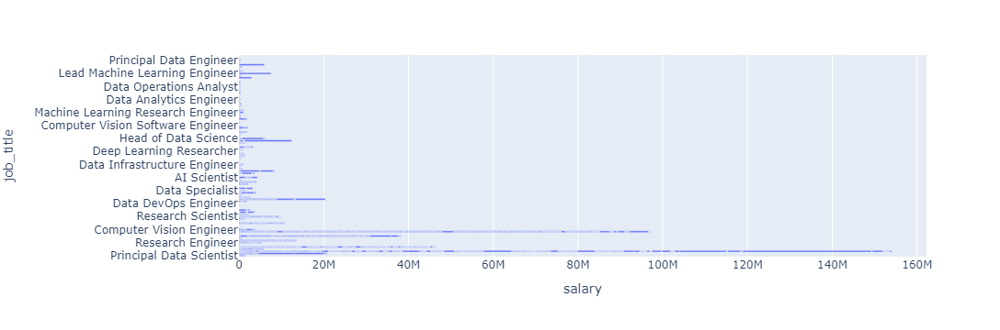

In [39]:
fig = px.bar(df, x = 'salary',y = 'job_title')
fig.show()

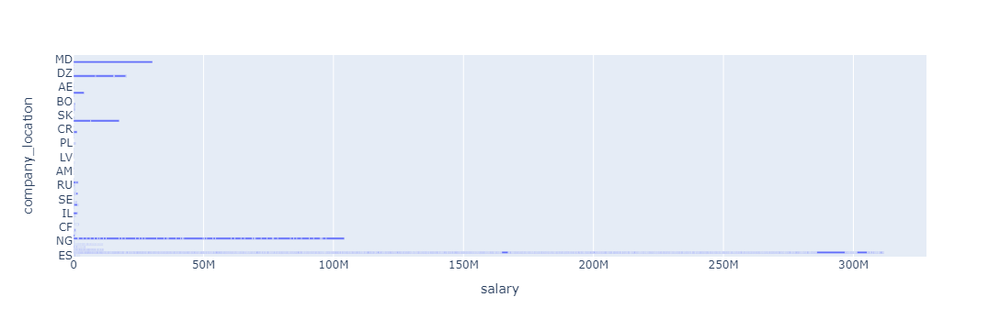

In [40]:
fig = px.bar(df, x = 'salary', y = 'company_location')
fig.show()

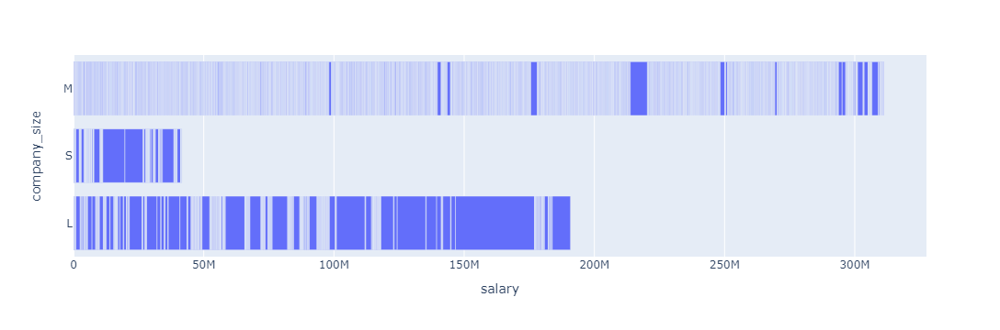

In [41]:
fig = px.bar(df,x ='salary', y = 'company_size')
fig.show()

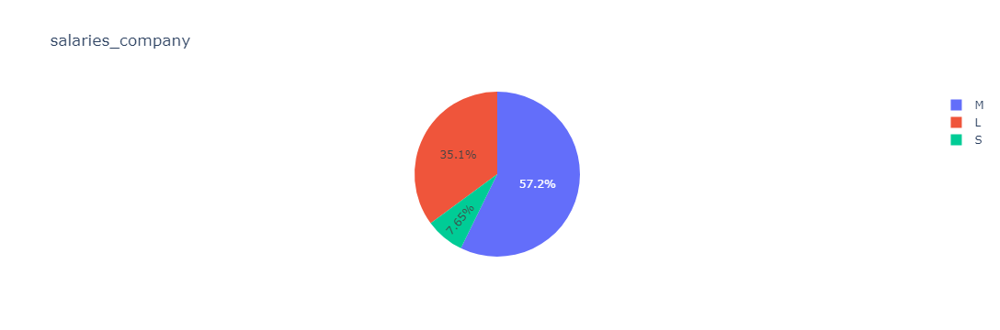

In [42]:
fig = px.pie(df, values='salary',names='company_size',title = 'salaries_company')
fig.show()

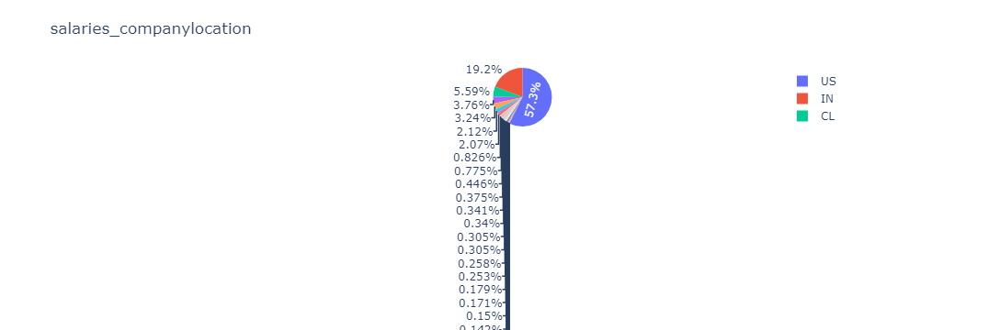

In [44]:
fig = px.pie(df, values = 'salary', names ='company_location',title = 'salaries_companylocation')
fig.show()

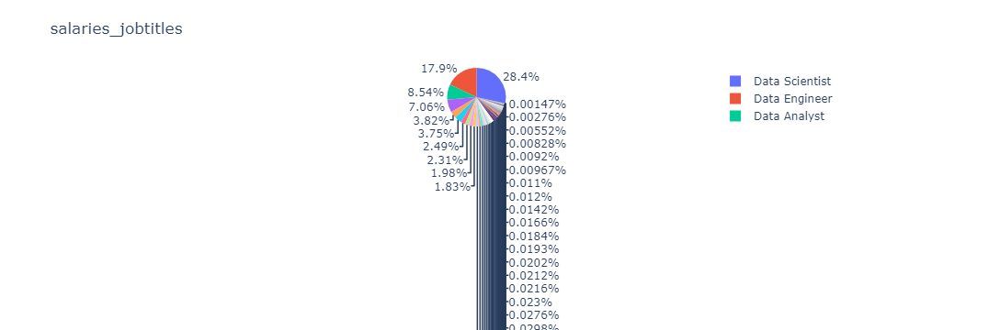

In [45]:
fig = px.pie(df, values='salary', names= 'job_title', title = 'salaries_jobtitles')
fig.show()

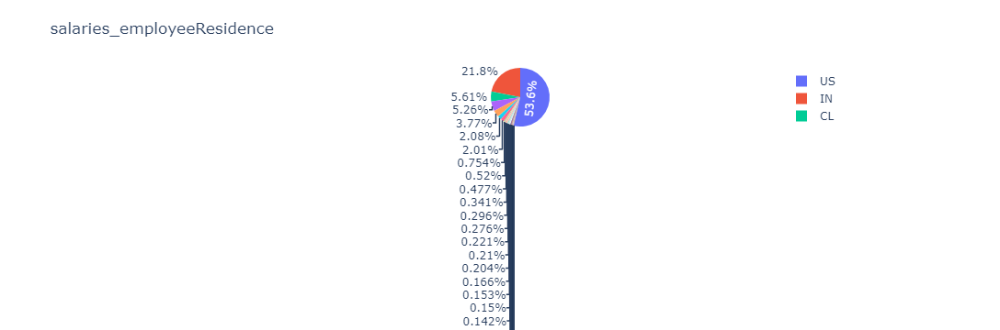

In [46]:
fig = px.pie(df,values='salary', names = 'employee_residence', title = 'salaries_employeeResidence')
fig.show()

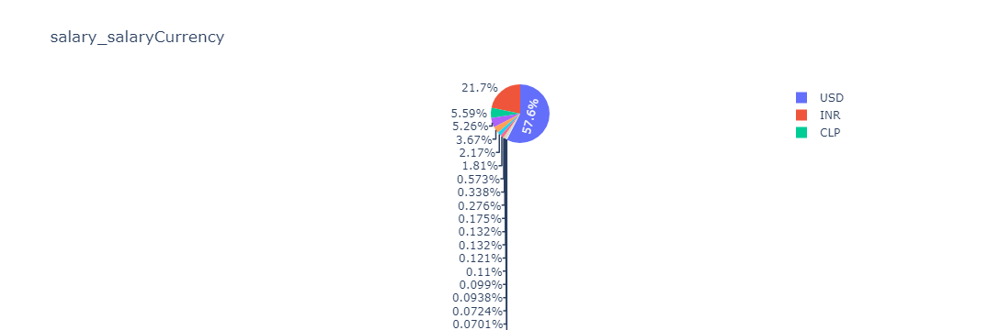

In [47]:
fig = px.pie(df, values='salary', names = 'salary_currency',title = 'salary_salaryCurrency')
fig.show()

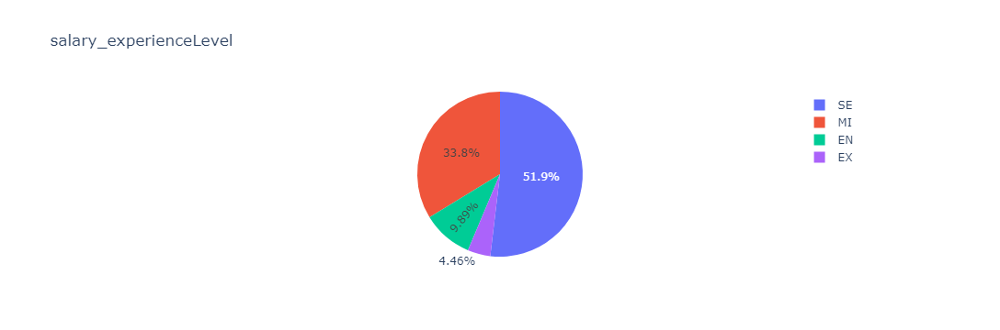

In [48]:
fig = px.pie(df, values='salary', names='experience_level',title = 'salary_experienceLevel')
fig.show()

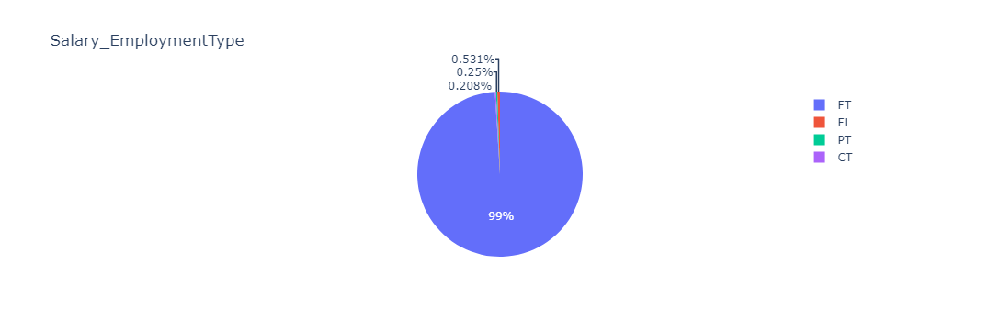

In [49]:
fig= px.pie(df, values='salary', names= 'employment_type',title = 'Salary_EmploymentType')
fig.show()

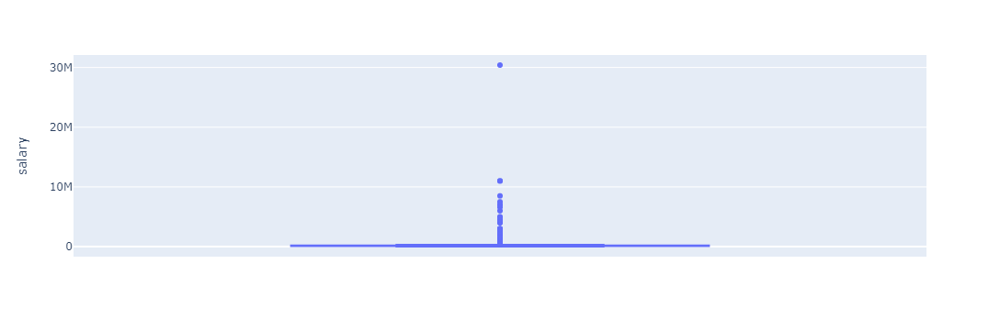

In [51]:
fig = px.box(df, y = 'salary')
fig.show()

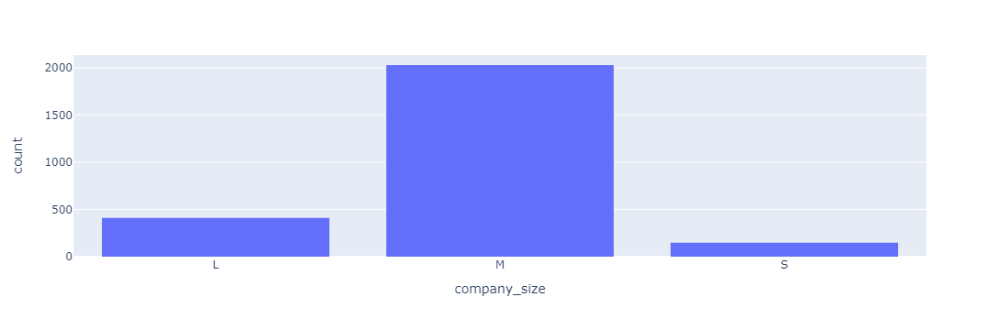

In [54]:
fig = px.histogram(df,x = 'company_size',category_orders = dict(company_size=['L','M','S']))
fig.show()

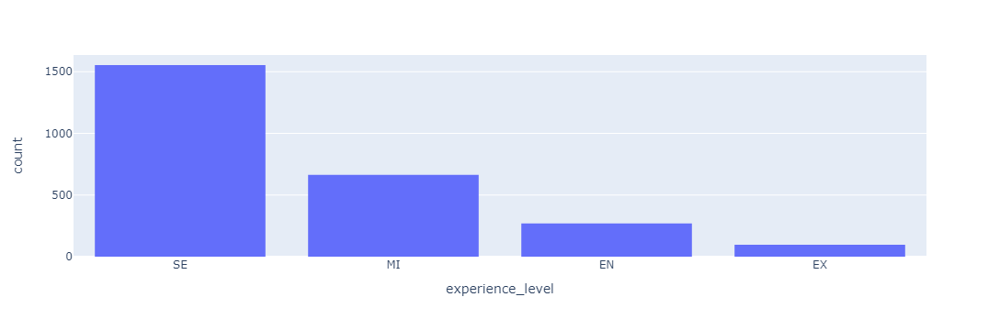

In [55]:
fig = px.histogram(df, x = 'experience_level',category_orders=dict(experience_level=['SE','MI','EN','EX']))
fig.show()

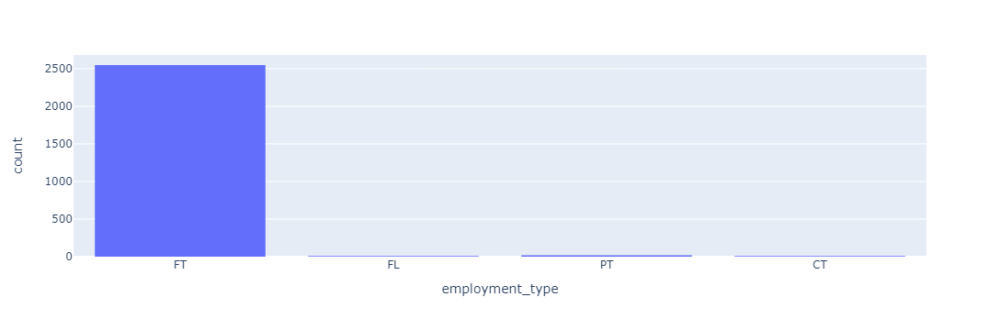

In [57]:
fig = px.histogram(df, x = 'employment_type',category_orders=dict(employment_type=['FT','FL','PT','CT']))
fig.show()

# Thank you!